In [1]:
import os 
import numpy as np
import scipy as sci
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as pl

import scanpy as sc
import anndata as ann

#data integration package
import scIB 
import scanpy.external as sce

from scipy.sparse import csr_matrix
from matplotlib import rcParams
from matplotlib import colors


sc.settings.verbosity = 3
sc.logging.print_versions()

scanpy==1.4.5.dev114+gd69832a anndata==0.6.22.post1 umap==0.3.9 numpy==1.17.0 scipy==1.3.0 pandas==0.25.0 scikit-learn==0.21.2 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1


In [2]:
sc.settings.set_figure_params(dpi=70)
sc.settings.verbosity = 3
sc.settings.n_jobs = 3
sc.set_figure_params(vector_friendly=True,color_map='viridis',dpi_save=600,transparent=True)

# Introduction

In this notebook, we annotate early life stress data from the Chen lab. The full dataset consists of 12 samples from 4 conditions.

We perform the following steps:
1. Load the data
2. Visualise
3. Check for Batch Effects and correct, if necessary
4. Visualise again, cluster, get characteristics

# Load data

In [3]:
adata = sc.read('./../data/data_norm.h5ad')

In [4]:
adata

AnnData object with n_obs × n_vars = 28167 × 18928 
    obs: 'batch', 'sample_id', 'sample_name', 'baseline', 'condition', 'adult_stress', 'n_counts', 'log_counts', 'n_genes', 'mt_fraction', 'size_factors'
    layers: 'counts'

# Highly variable genes

In [5]:
sc.pp.highly_variable_genes(adata, batch_key='sample_name', flavor='cell_ranger', n_top_genes=4000)

extracting highly variable genes
    finished (0:00:18)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


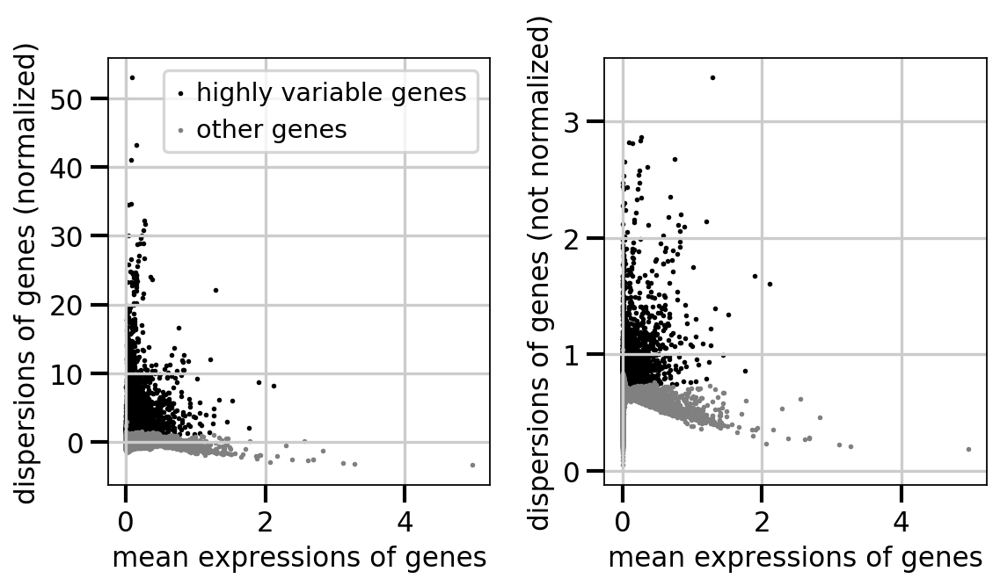

In [6]:
sc.pl.highly_variable_genes(adata)

# First visualisation

In [7]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata)
sc.tl.louvain(adata, resolution=0.5)
sc.tl.umap(adata)

computing PCA with n_comps = 50
computing PCA on highly variable genes
    finished (0:00:10)
computing neighbors
    using 'X_pca' with n_pcs = 50


/home/icb/daniel.strobl/miniconda3/envs/benchmarking_data_integration_dev/lib/python3.7/site-packages/umap/rp_tree.py:450: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "make_euclidean_tree" failed type inference due to: Cannot unify RandomProjectionTreeNode(array(int64, 1d, C), bool, none, none, none, none) and RandomProjectionTreeNode(none, bool, array(float32, 1d, C), float64, RandomProjectionTreeNode(array(int64, 1d, C), bool, none, none, none, none), RandomProjectionTreeNode(array(int64, 1d, C), bool, none, none, none, none)) for '$14.16', defined at /home/icb/daniel.strobl/miniconda3/envs/benchmarking_data_integration_dev/lib/python3.7/site-packages/umap/rp_tree.py (457)

File "../../../../../../../../../home/icb/daniel.strobl/miniconda3/envs/benchmarking_data_integration_dev/lib/python3.7/site-packages/umap/rp_tree.py", line 457:
def make_euclidean_tree(data, indices, rng_state, leaf_size=30):
    <source elided>

        lef

    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:07)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 24 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:03)
computing UMAP


/home/icb/daniel.strobl/miniconda3/envs/benchmarking_data_integration_dev/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 3 separate connected components using meta-embedding (experimental)
  n_components


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:32)


In [8]:
sc.tl.louvain(adata, resolution = 2, key_added='louvain_high_res')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 45 clusters and added
    'louvain_high_res', the cluster labels (adata.obs, categorical) (0:00:03)


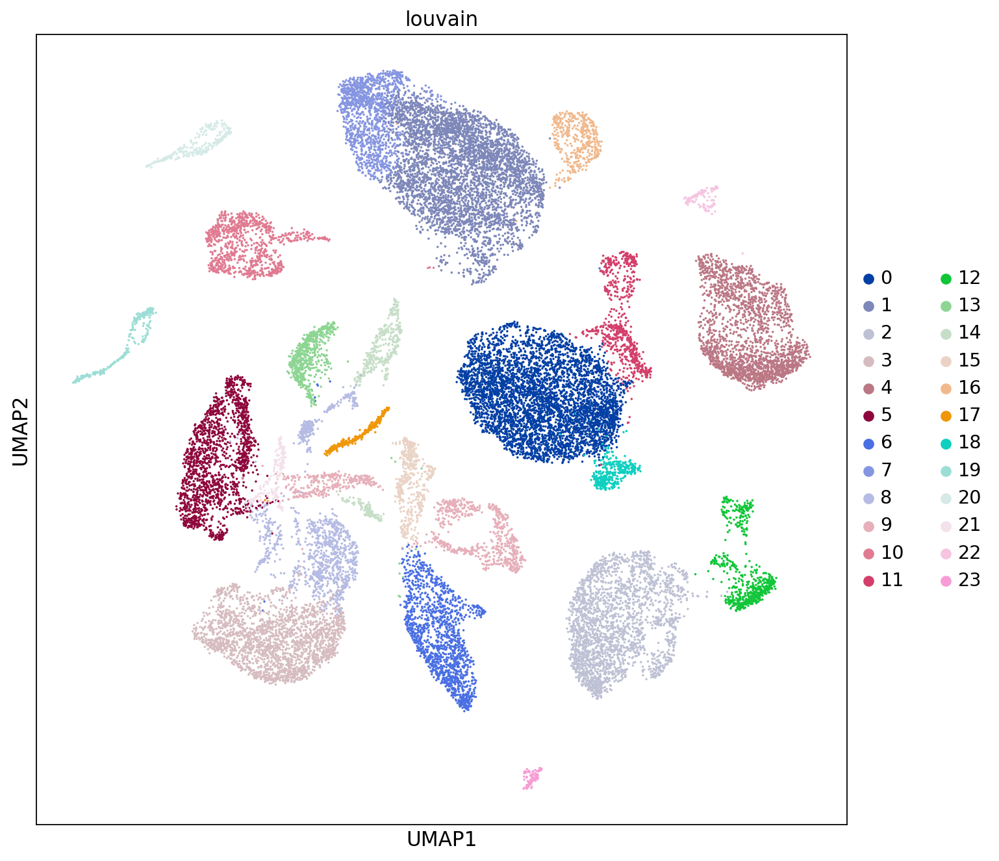

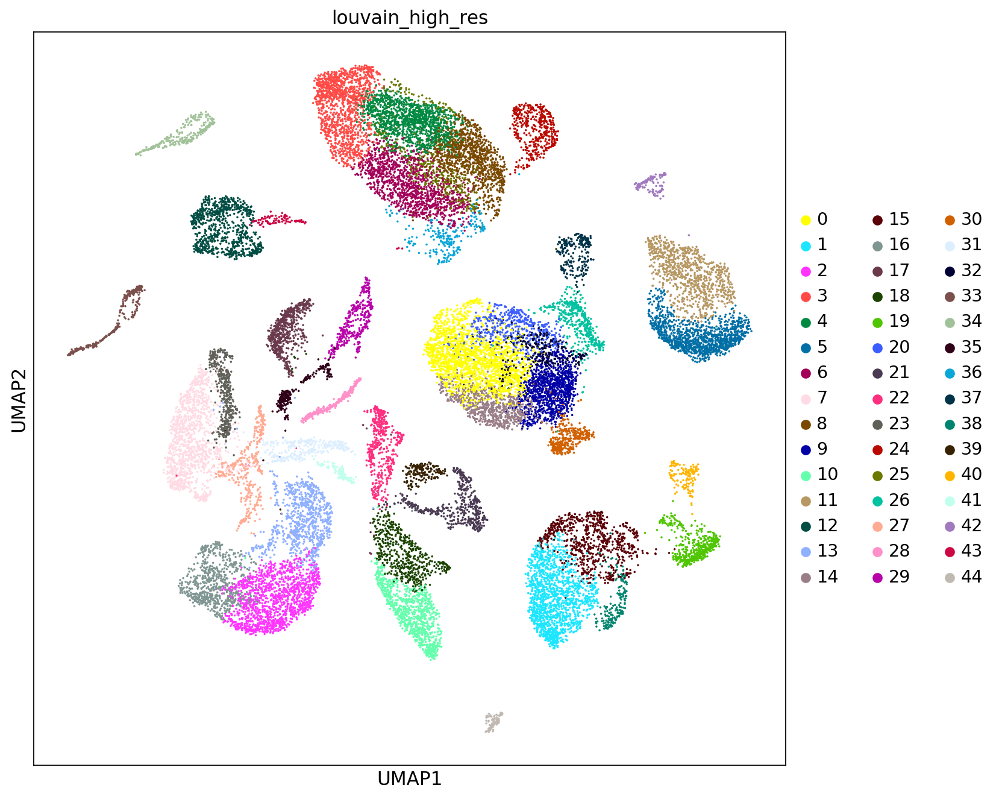

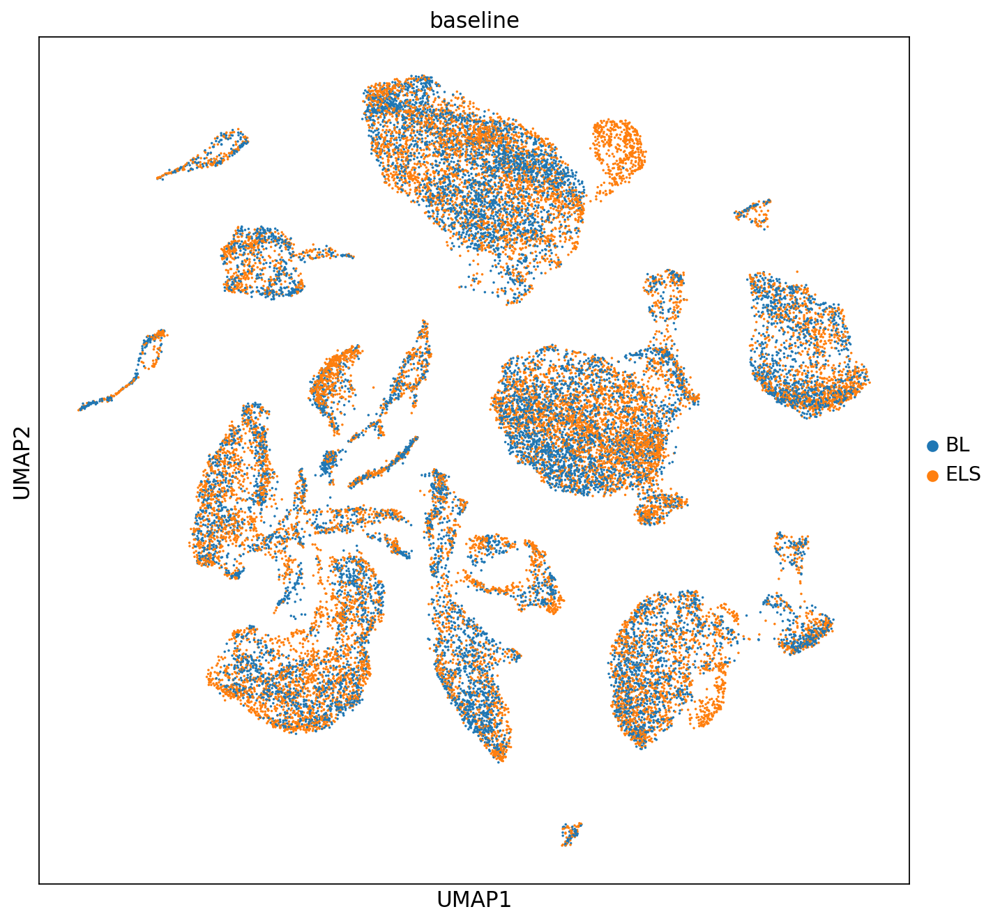

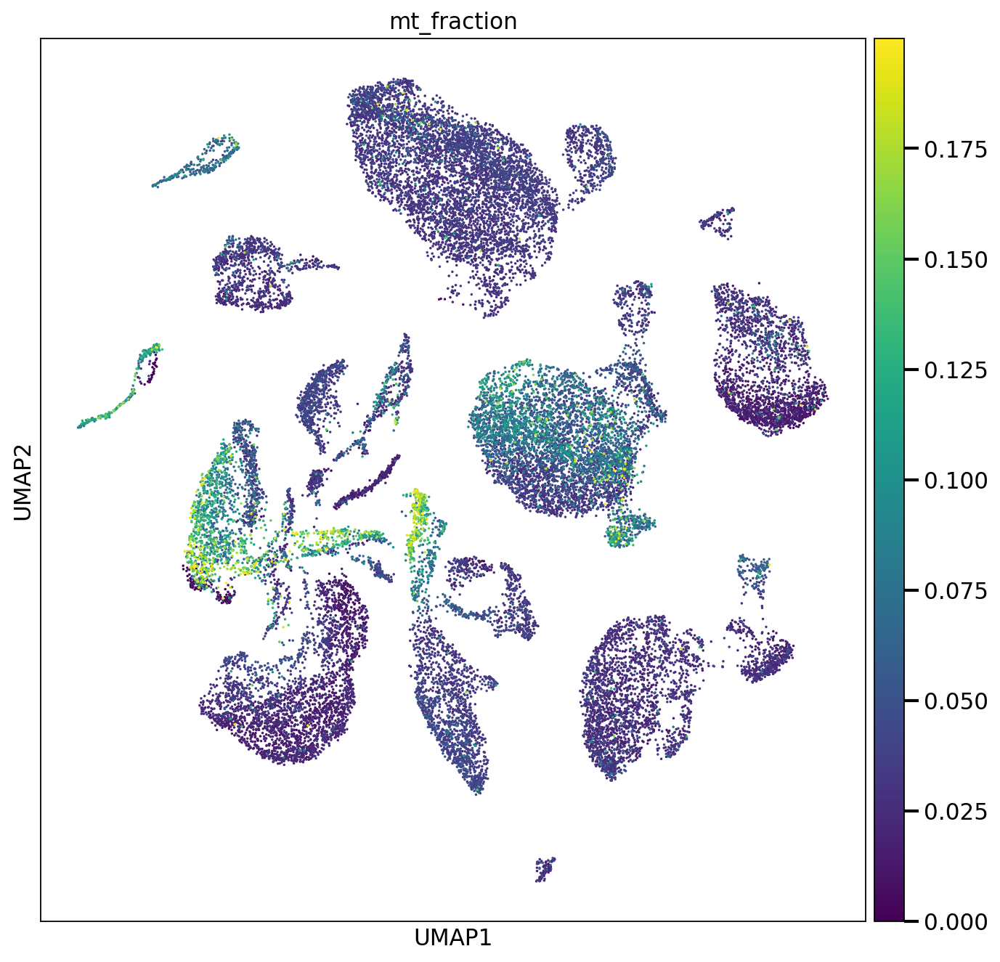

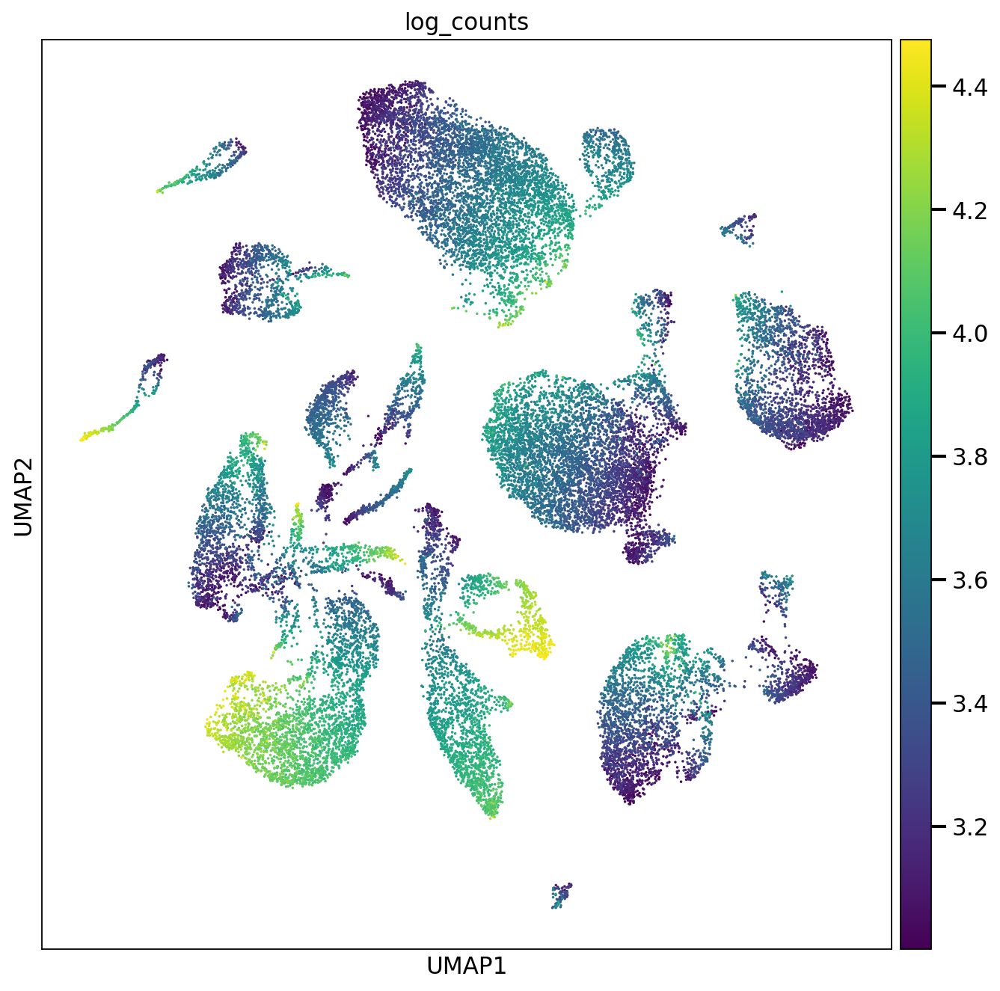

In [9]:
rcParams['figure.figsize']=(10,10)
sc.pl.umap(adata, color='louvain', size=10)
sc.pl.umap(adata, color='louvain_high_res', size=10)
sc.pl.umap(adata, color='baseline', size=10)
sc.pl.umap(adata, color='mt_fraction', size=10)
sc.pl.umap(adata, color='log_counts', size=10)

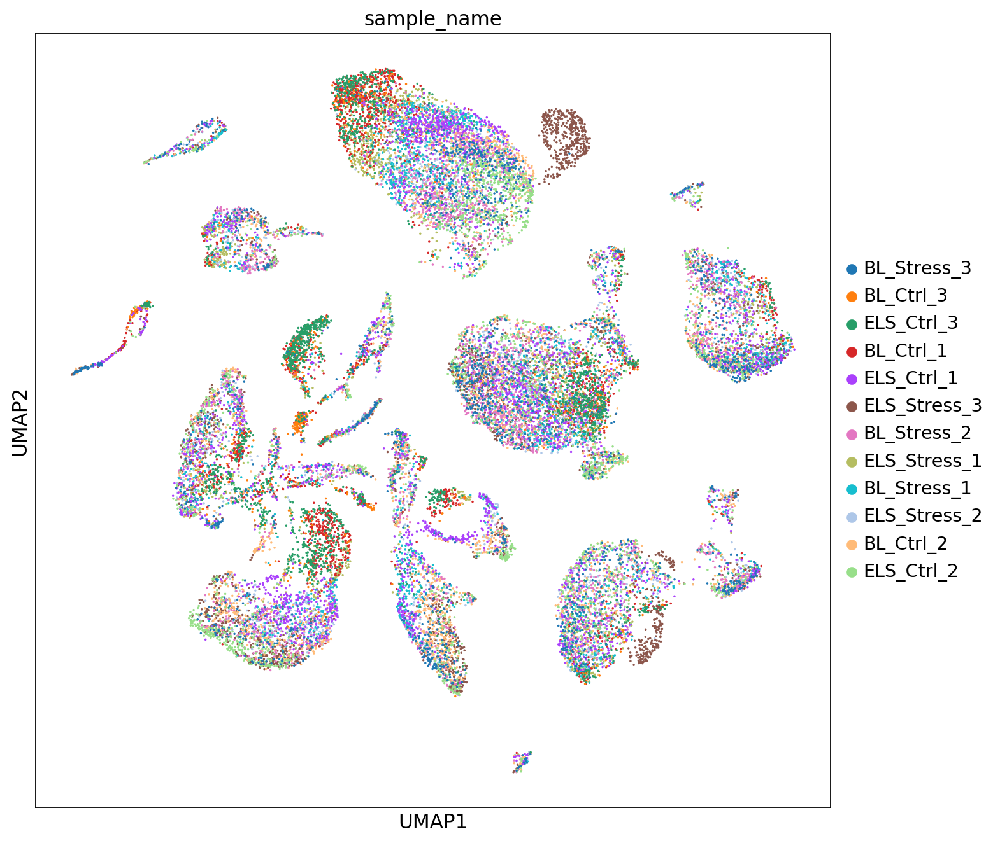

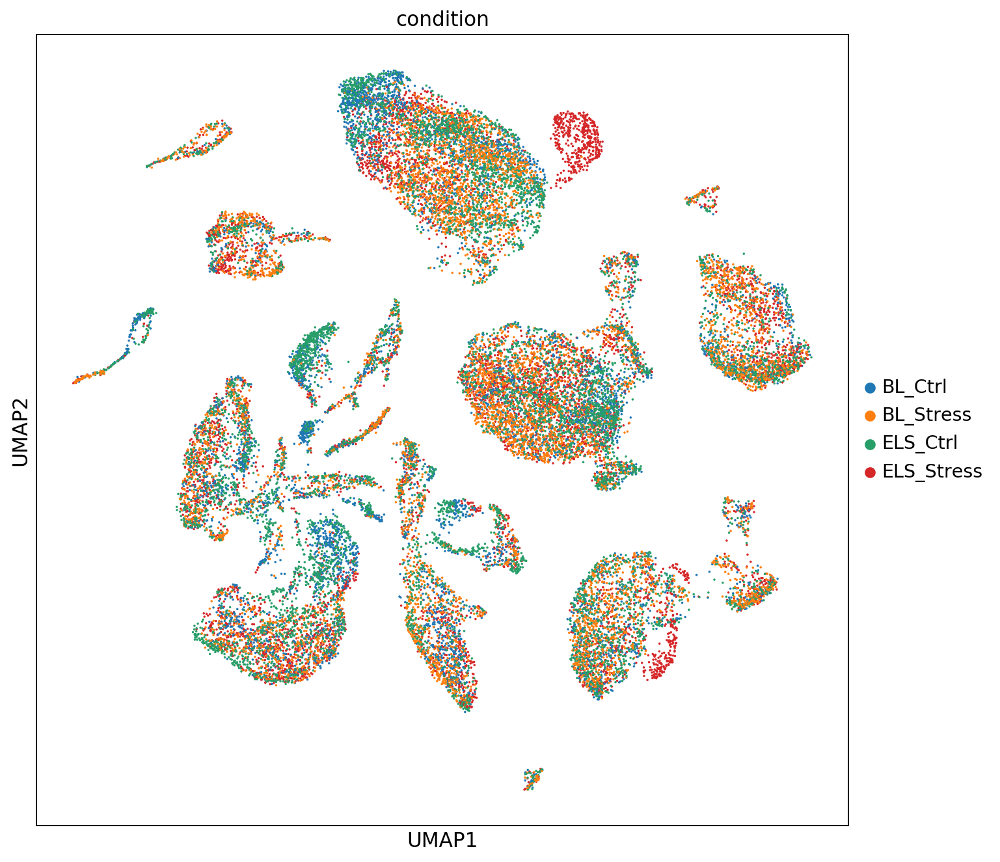

In [10]:
rcParams['figure.figsize']=(10,10)
sc.pl.umap(adata, color='sample_name', size=10)
sc.pl.umap(adata, color='condition', size=10)

## Compute cell cycle score

In [11]:
path_resource = '/storage/groups/ml01/workspace/maren.buettner/data_integration/'
g2m_genes = pd.read_csv(path_resource + 'Benchmarking_data_integration/scIB/resources/g2m_genes_tirosh.txt')
s_genes = pd.read_csv(path_resource + 'Benchmarking_data_integration/scIB/resources/s_genes_tirosh.txt')

In [12]:
sc.tl.score_genes_cell_cycle(adata, g2m_genes=g2m_genes, s_genes=s_genes)

calculating cell cycle phase
computing score 'S_score'


/home/icb/daniel.strobl/miniconda3/envs/benchmarking_data_integration_dev/lib/python3.7/site-packages/anndata/core/anndata.py:846: FutureWarning: In anndata v0.7+, arrays contained within an AnnData object will maintain their dimensionality. For example, prior to v0.7 `adata[0, 0].X` returned a scalar and `adata[0, :]` returned a 1d array, post v0.7 they will return two dimensional arrays. If you would like to get a one dimensional array from your AnnData object, consider using the `adata.obs_vector`, `adata.var_vector` methods or accessing the array directly.
  warn_flatten()


    finished: added
    'S_score', score of gene set (adata.obs) (0:00:15)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs) (0:00:14)
-->     'phase', cell cycle phase (adata.obs)


In [13]:
adata

AnnData object with n_obs × n_vars = 28167 × 18928 
    obs: 'batch', 'sample_id', 'sample_name', 'baseline', 'condition', 'adult_stress', 'n_counts', 'log_counts', 'n_genes', 'mt_fraction', 'size_factors', 'louvain', 'louvain_high_res', 'S_score', 'G2M_score', 'phase'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'pca', 'neighbors', 'louvain', 'louvain_colors', 'louvain_high_res_colors', 'baseline_colors', 'sample_name_colors', 'condition_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts'

In [14]:
adata.obs['phase'].value_counts()

S      17028
G1      7920
G2M     3219
Name: phase, dtype: int64

# Evaluate batch effects

## Full data set

Here, we compute the variance contribution of the condition, baseline and cell cycle to the data. 

In [15]:
pca = sc.tl.pca(adata.X, n_comps=50, use_highly_variable=False,
                return_info=True, svd_solver='arpack', copy=True)
X_pca = pca[0].copy()
pca_sd = pca[3].copy()

computing PCA with n_comps = 50
    finished (0:00:15)


In [16]:
R2Var = dict()
# fit linear model for n_comps PCs
from sklearn.linear_model import LinearRegression

n_comps = adata.obsm['X_pca'].shape[1]


batch = adata.obs['phase'].astype('category').cat.codes
batch = pd.get_dummies(batch) if 'category' == str(batch.dtype) else np.array(batch)

r2 = []
for i in range(n_comps):
    lm = LinearRegression()
    lm.fit(X_pca[:, [i]], batch)
    r2.append(lm.score(X_pca[:, [i]], batch))
    
Var = pca_sd**2 / sum(pca_sd**2) * 100
R2Var['phase'] = sum(r2*Var)/100

batch = adata.obs['baseline']
batch = pd.get_dummies(batch) if 'category' == str(batch.dtype) else np.array(batch)

r2 = []
for i in range(n_comps):
    lm = LinearRegression()
    lm.fit(X_pca[:, [i]], batch)
    r2.append(lm.score(X_pca[:, [i]], batch))
    
Var = pca_sd**2 / sum(pca_sd**2) * 100
R2Var['baseline'] = sum(r2*Var)/100


batch = adata.obs['condition']
batch = pd.get_dummies(batch) if 'category' == str(batch.dtype) else np.array(batch)


r2 = []
for i in range(n_comps):
    lm = LinearRegression()
    lm.fit(X_pca[:, [i]], batch)
    r2.append(lm.score(X_pca[:, [i]], batch))
    
Var = pca_sd**2 / sum(pca_sd**2) * 100
R2Var['condition'] = sum(r2*Var)/100


/home/icb/daniel.strobl/miniconda3/envs/benchmarking_data_integration_dev/lib/python3.7/site-packages/sklearn/base.py:420: FutureWarning: The default value of multioutput (not exposed in score method) will change from 'variance_weighted' to 'uniform_average' in 0.23 to keep consistent with 'metrics.r2_score'. To specify the default value manually and avoid the warning, please either call 'metrics.r2_score' directly or make a custom scorer with 'metrics.make_scorer' (the built-in scorer 'r2' uses multioutput='uniform_average').
  "multioutput='uniform_average').", FutureWarning)
/home/icb/daniel.strobl/miniconda3/envs/benchmarking_data_integration_dev/lib/python3.7/site-packages/sklearn/base.py:420: FutureWarning: The default value of multioutput (not exposed in score method) will change from 'variance_weighted' to 'uniform_average' in 0.23 to keep consistent with 'metrics.r2_score'. To specify the default value manually and avoid the warning, please either call 'metrics.r2_score' direc

In [17]:
R2Var

{'phase': 0.12079333802262013,
 'baseline': 0.0012811776911940249,
 'condition': 0.001193904176891774}

## Correct for batch effects using scanorama

Let us compute an integrated data set with scanorama. For this purpose we use the subset of highly variable genes, also to increase the signal-to-noise ratio.

In [18]:
adata_hvg = adata[:,adata.var['highly_variable']].copy()

In [19]:
adata_hvg = scIB.integration.runScanorama(adata_hvg, batch='sample_name')

/home/icb/daniel.strobl/miniconda3/envs/benchmarking_data_integration_dev/lib/python3.7/site-packages/sklearn/externals/six.py:31: DeprecationWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", DeprecationWarning)


Found 4000 genes among all datasets
[[0.         0.77173913 0.51037549 0.24703557 0.62598814 0.31175889
  0.36017787 0.29008746 0.32608696 0.14031621 0.26284585 0.19285365]
 [0.         0.         0.21831239 0.47935368 0.65480729 0.68509874
  0.69009826 0.18804665 0.51059246 0.52095348 0.13570741 0.49534998]
 [0.         0.         0.         0.16071429 0.28081321 0.19551282
  0.13151927 0.67201166 0.28800366 0.10265283 0.63763234 0.09642682]
 [0.         0.         0.         0.         0.48412112 0.45457903
  0.41506647 0.08309038 0.24926145 0.34525183 0.05341675 0.52520803]
 [0.         0.         0.         0.         0.         0.57390936
  0.68707483 0.18367347 0.4498094  0.37524029 0.13763234 0.52129222]
 [0.         0.         0.         0.         0.         0.
  0.6866969  0.23760933 0.64719247 0.79008074 0.19149627 0.53303965]
 [0.         0.         0.         0.         0.         0.
  0.         0.16909621 0.55102041 0.73702422 0.14852608 0.68232991]
 [0.         0.      

In [20]:
adata_hvg

AnnData object with n_obs × n_vars = 28167 × 4000 
    obs: 'G2M_score', 'S_score', 'adult_stress', 'baseline', 'batch', 'condition', 'log_counts', 'louvain', 'louvain_high_res', 'mt_fraction', 'n_counts', 'n_genes', 'phase', 'sample_id', 'sample_name', 'size_factors'
    uns: 'emb'
    obsm: 'X_pca'

In [21]:
sc.tl.pca(adata_hvg, svd_solver='arpack')
sc.pp.neighbors(adata_hvg)
sc.tl.louvain(adata_hvg, resolution=0.5)
sc.tl.umap(adata_hvg)

computing PCA with n_comps = 50
    finished (0:00:04)
computing neighbors
    using 'X_pca' with n_pcs = 50


/home/icb/daniel.strobl/miniconda3/envs/benchmarking_data_integration_dev/lib/python3.7/site-packages/umap/rp_tree.py:450: NumbaWarning: 
Compilation is falling back to object mode WITH looplifting enabled because Function "make_euclidean_tree" failed type inference due to: Cannot unify RandomProjectionTreeNode(array(int64, 1d, C), bool, none, none, none, none) and RandomProjectionTreeNode(none, bool, array(float32, 1d, C), float64, RandomProjectionTreeNode(array(int64, 1d, C), bool, none, none, none, none), RandomProjectionTreeNode(array(int64, 1d, C), bool, none, none, none, none)) for '$14.16', defined at /home/icb/daniel.strobl/miniconda3/envs/benchmarking_data_integration_dev/lib/python3.7/site-packages/umap/rp_tree.py (457)

File "../../../../../../../../../home/icb/daniel.strobl/miniconda3/envs/benchmarking_data_integration_dev/lib/python3.7/site-packages/umap/rp_tree.py", line 457:
def make_euclidean_tree(data, indices, rng_state, leaf_size=30):
    <source elided>

        lef

    finished: added to `.uns['neighbors']`
    'distances', distances for each pair of neighbors
    'connectivities', weighted adjacency matrix (0:00:06)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 29 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:03)
computing UMAP


/home/icb/daniel.strobl/miniconda3/envs/benchmarking_data_integration_dev/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 5 separate connected components using meta-embedding (experimental)
  n_components


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:48)


In [22]:
sc.tl.louvain(adata_hvg, resolution = 2, key_added='louvain_high_res')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 51 clusters and added
    'louvain_high_res', the cluster labels (adata.obs, categorical) (0:00:03)


... storing 'adult_stress' as categorical
... storing 'baseline' as categorical
... storing 'condition' as categorical
... storing 'phase' as categorical
... storing 'sample_id' as categorical
... storing 'sample_name' as categorical


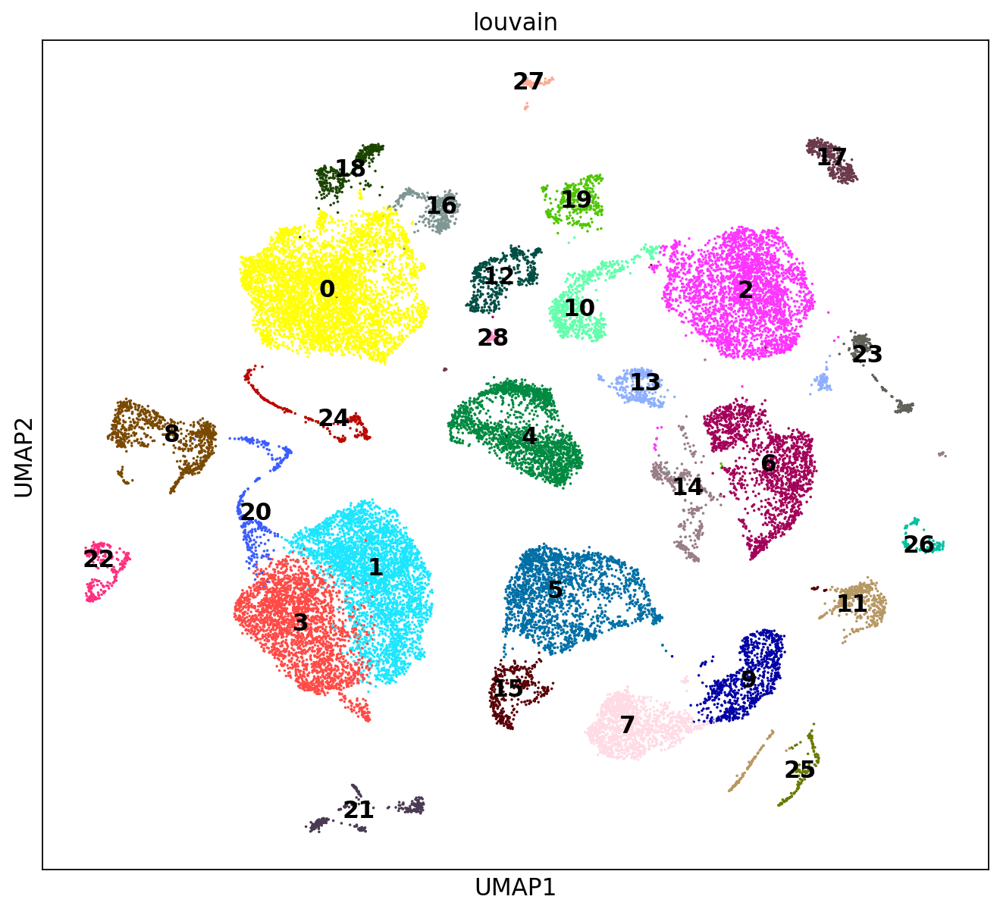

In [23]:
sc.pl.umap(adata_hvg, color='louvain', size=10, legend_loc='on data')

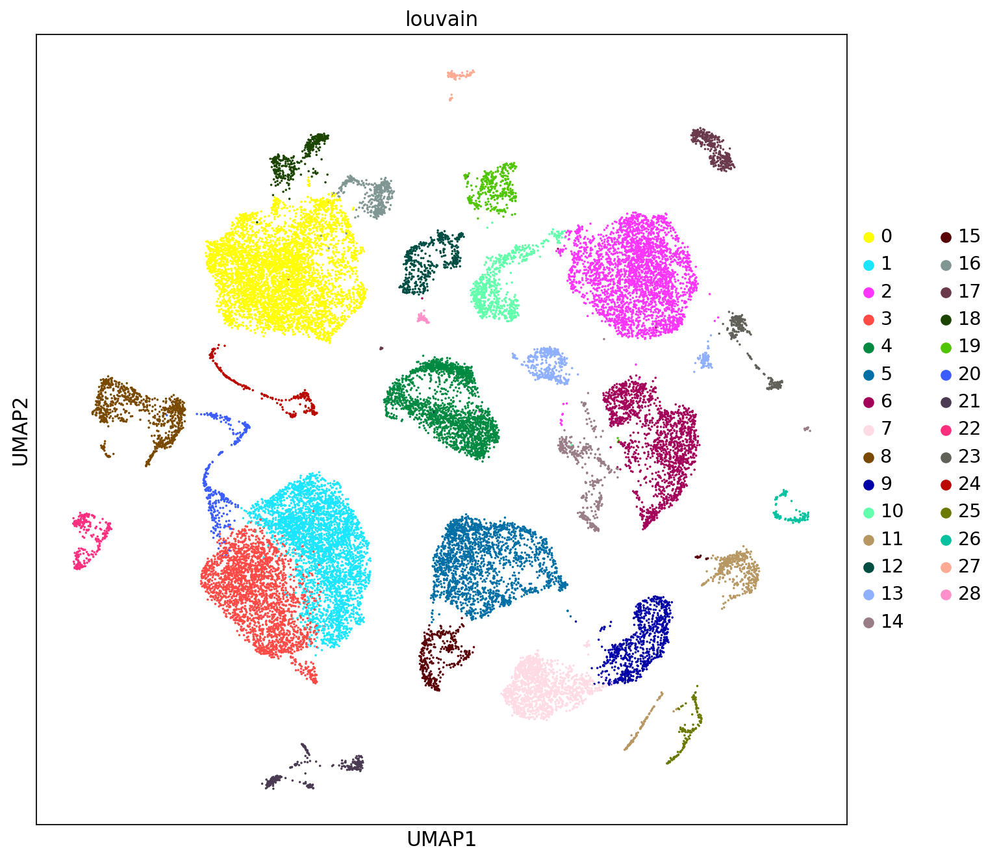

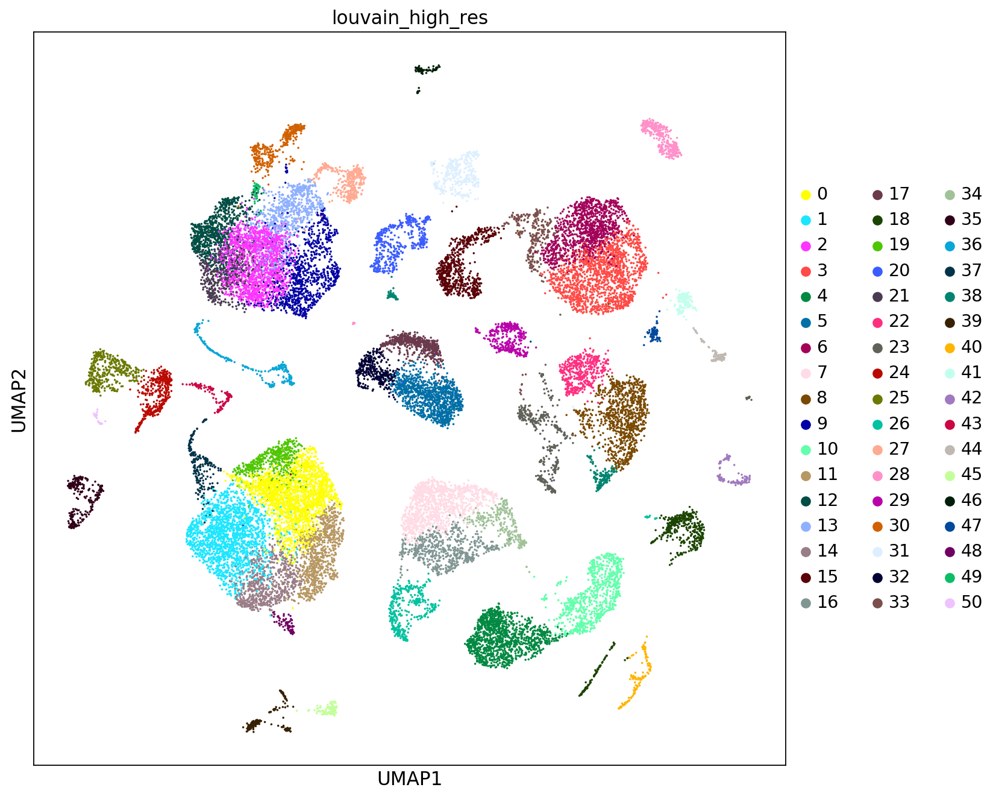

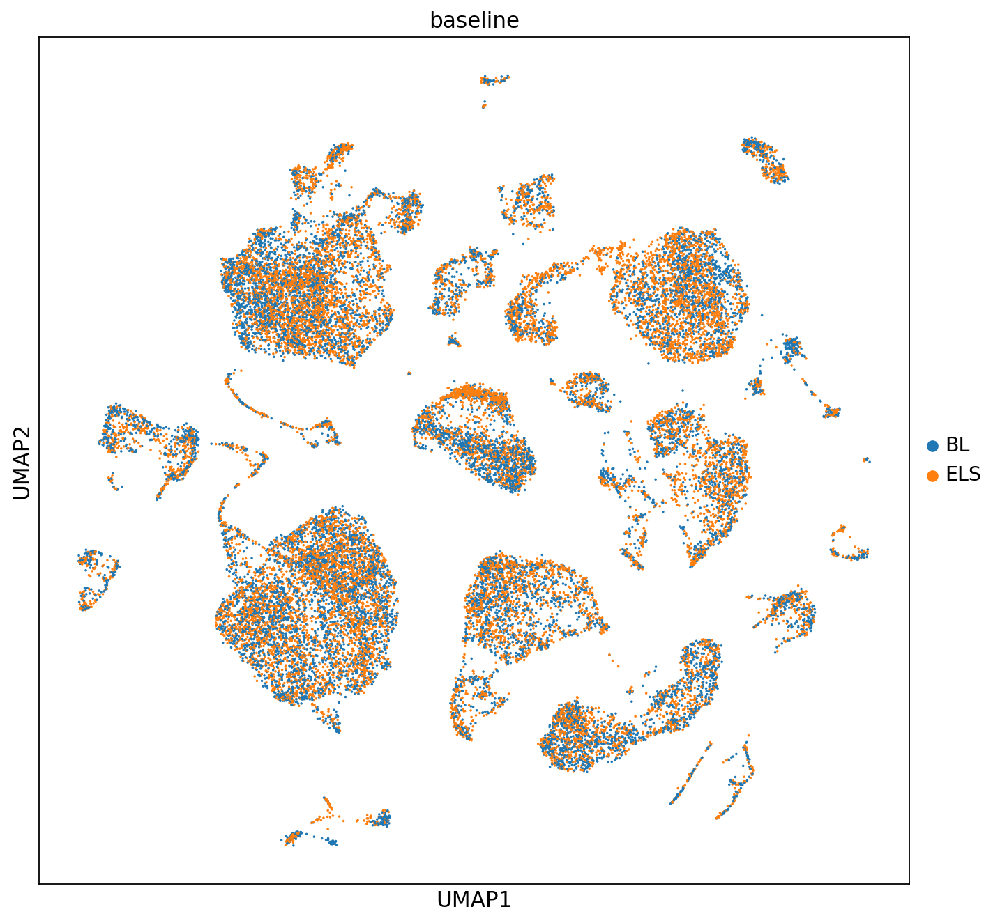

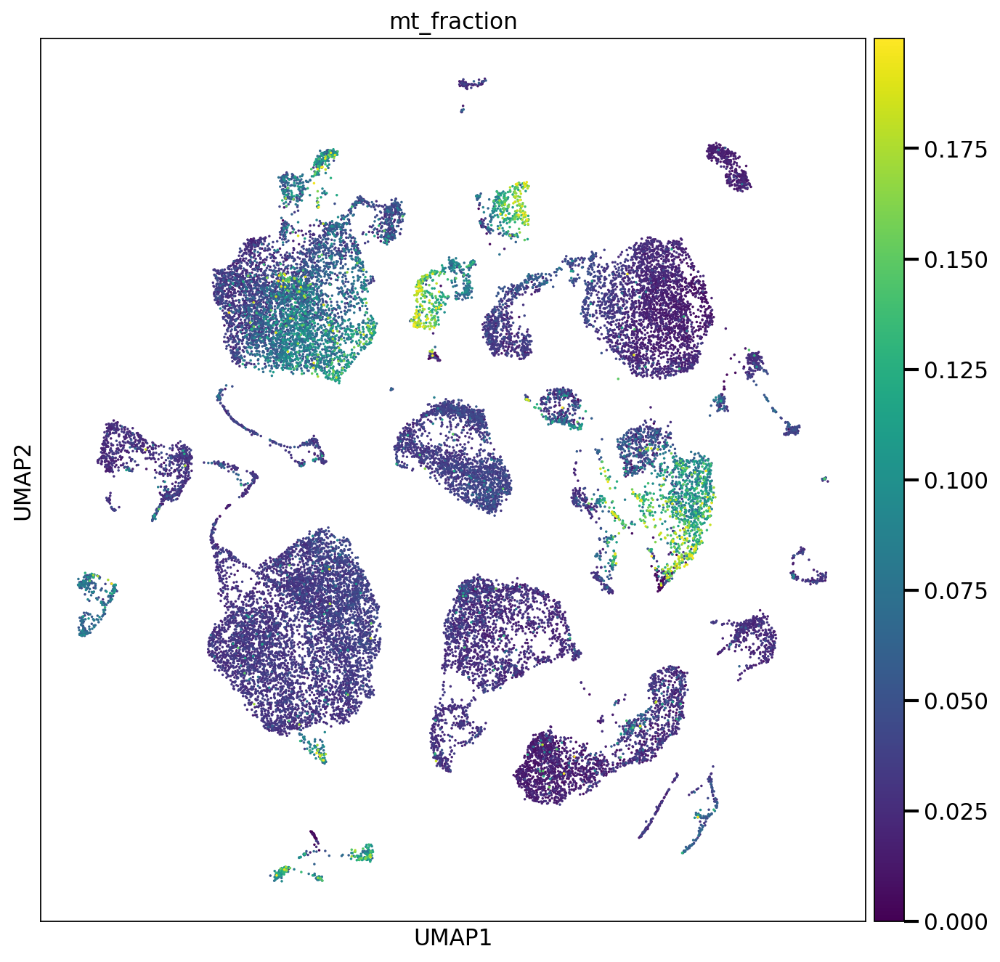

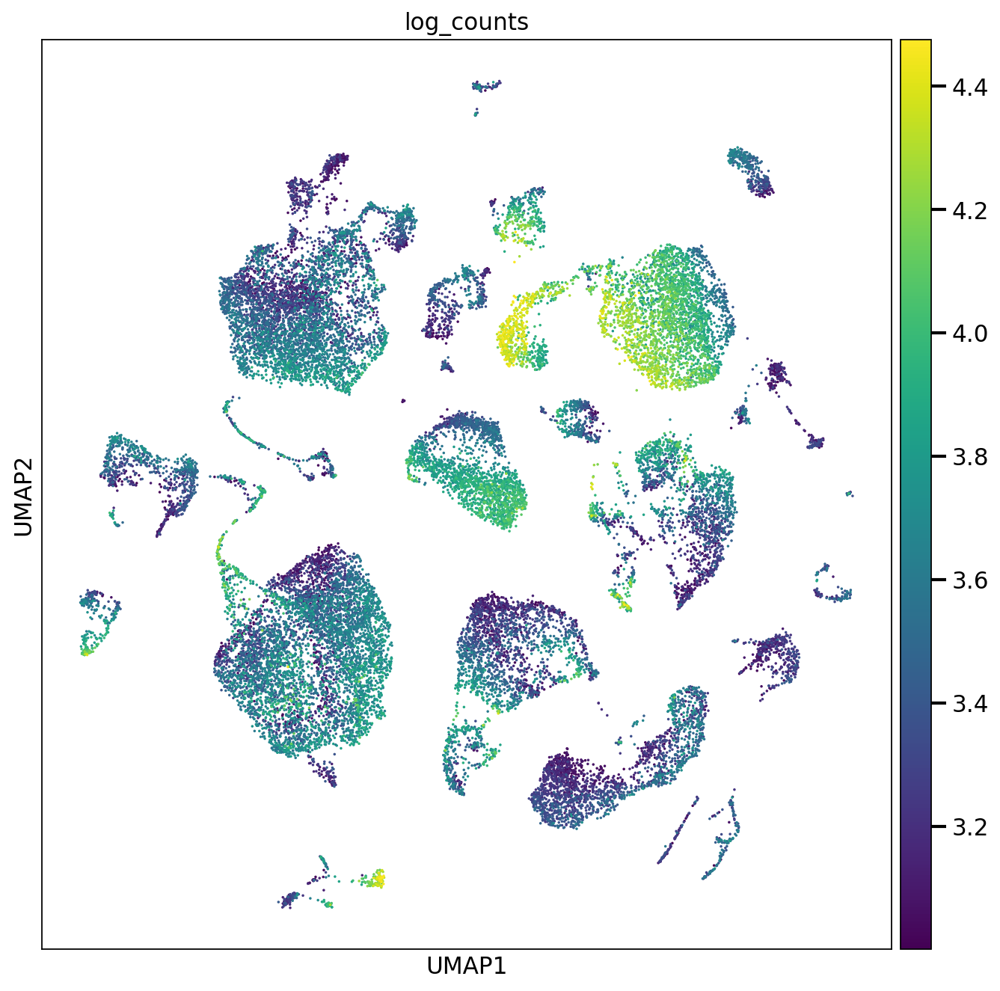

In [24]:
rcParams['figure.figsize']=(10,10)
sc.pl.umap(adata_hvg, color='louvain', size=10)
sc.pl.umap(adata_hvg, color='louvain_high_res', size=10)
sc.pl.umap(adata_hvg, color='baseline', size=10)
sc.pl.umap(adata_hvg, color='mt_fraction', size=10)
sc.pl.umap(adata_hvg, color='log_counts', size=10)

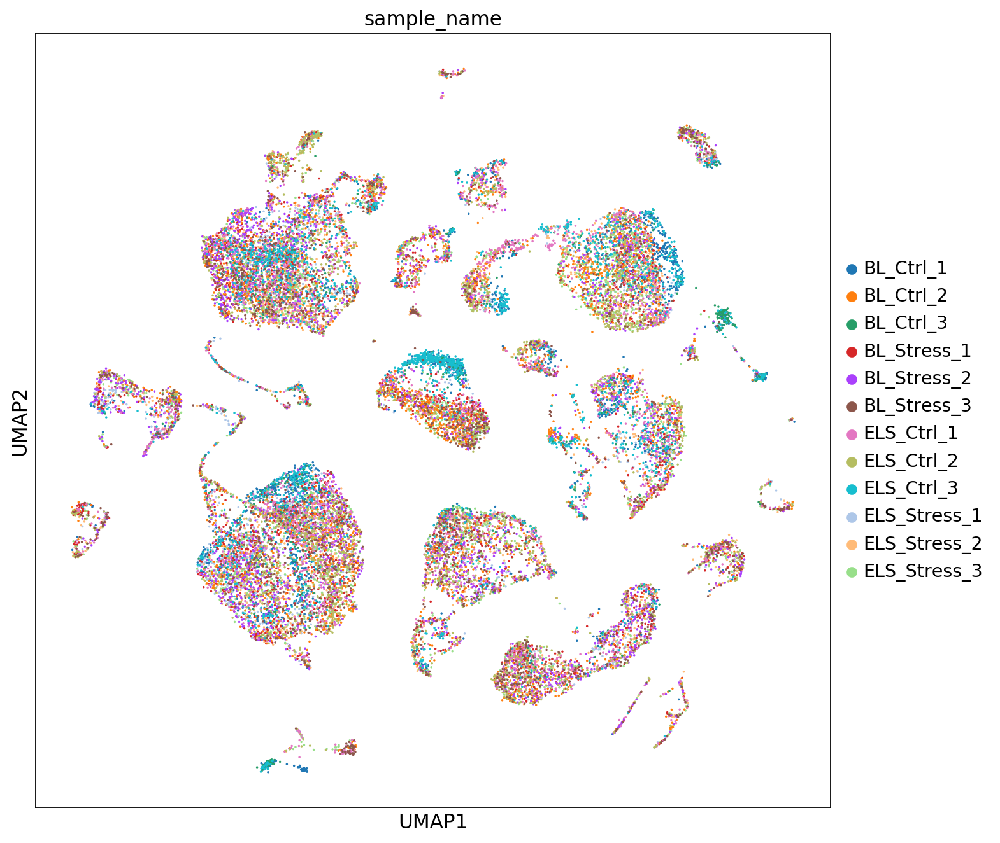

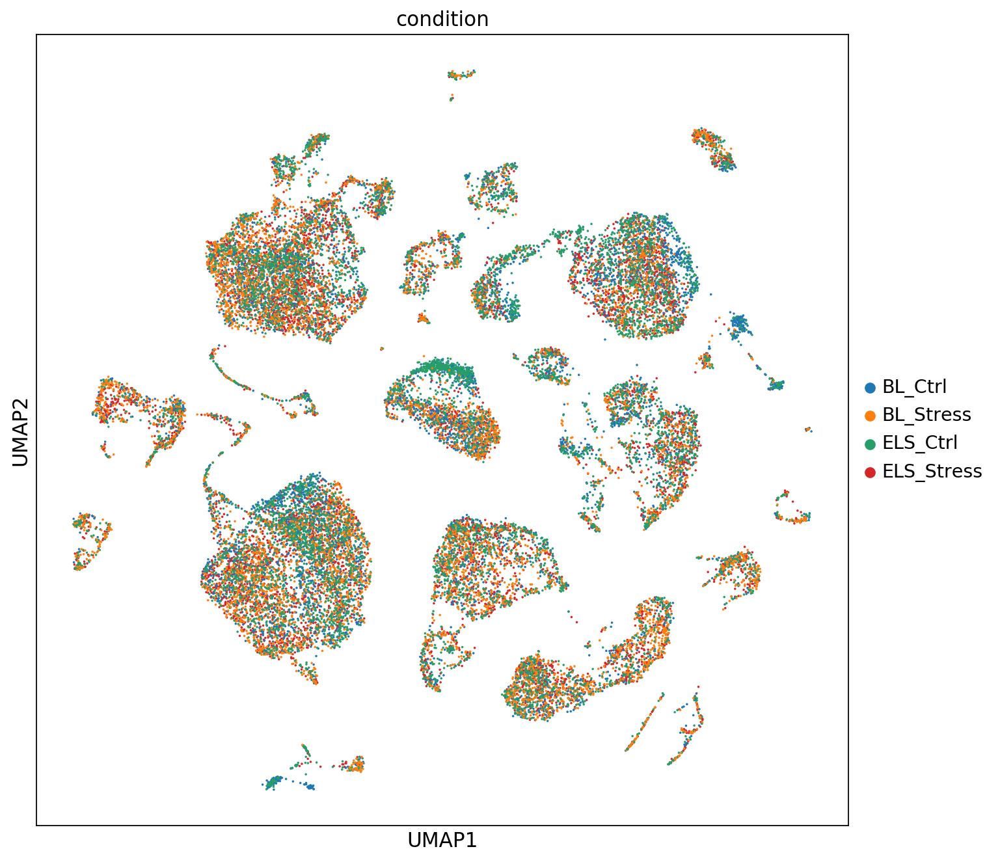

In [25]:
rcParams['figure.figsize']=(10,10)
sc.pl.umap(adata_hvg, color='sample_name', size=10)
sc.pl.umap(adata_hvg, color='condition', size=10)

In [26]:
sc.write(adata=adata_hvg, filename='./../data/data_scanorama_hvg4000.h5ad')

In [3]:
adata_hvg = sc.read('./../data/data_scanorama_hvg4000.h5ad')

In [4]:
adata = sc.read('./../data/cellxgene.h5ad')

Conclusion: Scanorama succeeded largely in integrating the separate cells. 

In [27]:
adata.obs['louvain'] = adata_hvg.obs['louvain'].values
adata.obs['louvain_high_res'] = adata_hvg.obs['louvain_high_res'].values
adata.obsm['X_pca'] = adata_hvg.obsm['X_pca']
adata.obsm['X_umap'] = adata_hvg.obsm['X_umap']
adata.uns['neighbors'] = adata_hvg.uns['neighbors']

# Characterize clusters

In [59]:
sc.tl.rank_genes_groups(adata_hvg, groupby='louvain')

ranking genes


/home/icb/daniel.strobl/miniconda3/envs/benchmarking_data_integration_dev/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:244: RuntimeWarning: invalid value encountered in log2
  rankings_gene_logfoldchanges.append(np.log2(foldchanges[global_indices]))
/home/icb/daniel.strobl/miniconda3/envs/benchmarking_data_integration_dev/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:244: RuntimeWarning: invalid value encountered in log2
  rankings_gene_logfoldchanges.append(np.log2(foldchanges[global_indices]))
/home/icb/daniel.strobl/miniconda3/envs/benchmarking_data_integration_dev/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:244: RuntimeWarning: invalid value encountered in log2
  rankings_gene_logfoldchanges.append(np.log2(foldchanges[global_indices]))
/home/icb/daniel.strobl/miniconda3/envs/benchmarking_data_integration_dev/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:244: RuntimeWarning: invalid value encountered in log2
  ra

    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:43)


In [60]:
sc.pl.rank_genes_groups(adata_hvg, fontsize =20, n_genes=30)

# save to file for cellXgene

Save the results for cellxgene browser display.  

In [31]:
sc.write(adata=adata, filename= './../data/cellxgene.h5ad')

# annotate clusters

Pablo has annotated the clusters as follows (as of October 1st 2019).

* 0 = Astrocytes 1
* 1 = Oligodendrocytes 1
* 2 = Neurons_Glutamatergic 1
* 3 = Oligodendrocytes 2
* 4 = Neurons_Glutamatergic 2
* 5 = Endothelial Cells 1
* 6 = Neurons_Glutamatergic 3
* 7 = Microglia 1
* 8 = Oligodendrocyte Progenitor Cells (OPCs)
* 9 = Microglia 2
* 10 = Neurons_Glutamatergic 4
* 11 = Pericytes
* 12 = Neurons_Glutamatergic 5
* 13 = Neurons_Glutamatergic 6
* 14 = Neurons_GABA
* 15 = Endothelial Cells 2
* 16 = Astrocytes 2
* 17 = Neurons_Cajal–Retzius
* 18 = Astrocytes 3
* 19 = Neurons_Glutamatergic 7
* 20 = Committed Oligodendrocyte Progenitors (COPs) + Oligodendrocytes (mature)
* 21 = Choroid Plexus Epithelial Cells
* 22 = Ependymal Cells
* 23 = Neurons_Cck
* 24 = Neural Progenitor Cells (NPCs)
* 25 = Vascular Cells
* 26 = Macrophages
* 27 = Meningeal Cells
* 28 = Neurons_Glutamatergic 8

Thus, let us resolve cluster 20 to separate oligodendrocyte progenitors and oligodendrocytes, *i.e.* use the louvain_high_res clustering. Here, cluster 43 corresponds to the COPs and cluster 37 to mature oligodendrocytes.

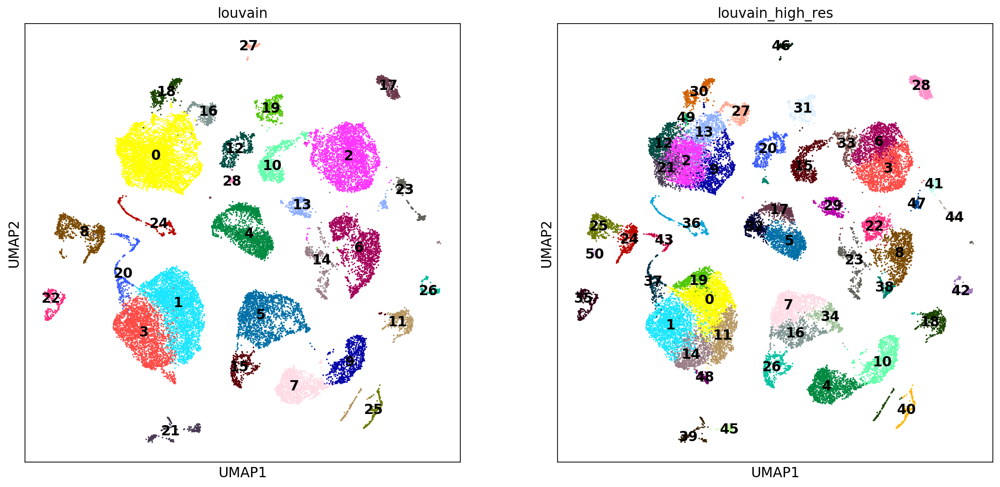

In [11]:
rcParams['figure.figsize']=(8,8)
sc.pl.umap(adata_hvg, color=['louvain','louvain_high_res'], size=10, legend_loc='on data')

In [23]:
annotation_dict = {
    '0': 'Astrocytes_1',
 '1' : 'Oligodendrocytes_1', 
 '2' : 'Neurons_Glutamatergic_1', 
'3' : 'Oligodendrocytes_2', 
 '4' : 'Neurons_Glutamatergic_2',
 '5' : 'Endothelial Cells_1', 
 '6' : 'Neurons_Glutamatergic_3', 
 '7' : 'Microglia_1', 
 '8' : 'Oligodendrocyte Progenitor Cells (OPCs)',
 '9' : 'Microglia_2' ,
 '10' : 'Neurons_Glutamatergic_4', 
 '11' : 'Pericytes',
 '12' : 'Neurons_Glutamatergic_5',
 '13' : 'Neurons_Glutamatergic_6' ,
 '14' : 'Neurons_GABA',
 '15' : 'Endothelial Cells_2' ,
 '16' : 'Astrocytes_2' ,
 '17' : 'Neurons_Cajal–Retzius',
 '18' : 'Astrocytes_3' ,
 '19' : 'Neurons_Glutamatergic_7' ,
 '20' : 'COPs+Oligodendrocytes',
 '21' : 'Choroid Plexus Epithelial Cells',
 '22' : 'Ependymal Cells',
 '23' : 'Neurons_Cck',
 '24' : 'Neural Progenitor Cells (NPCs)',
 '25' : 'Vascular Cells',
 '26' : 'Macrophages',
 '27' : 'Meningeal Cells',
 '28' : 'Neurons_Glutamatergic_8',
}

In [24]:
adata.obs['cell_type'] = adata.obs['louvain'].cat.rename_categories(annotation_dict)

In [25]:
adata.obs['cell_type'] = adata.obs['cell_type'].cat.add_categories(['Astrocytes', 'Oligodendrocytes', 
                                                                   'Neurons_Glutamatergic', 'Endothelial Cells',
                                                       'Microglia','Committed Oligodendrocyte Progenitors (COPs)'
                                                                   ])

adata.obs['cell_type'][np.in1d(adata.obs['cell_type'], 
                               ['Astrocytes_1','Astrocytes_2', 'Astrocytes_3'])] = 'Astrocytes'
adata.obs['cell_type'][np.in1d(adata.obs['cell_type'], 
                               ['Oligodendrocytes_1','Oligodendrocytes_2'])] = 'Oligodendrocytes'
adata.obs['cell_type'][np.in1d(adata.obs['cell_type'], 
                               ['Neurons_Glutamatergic_1','Neurons_Glutamatergic_2',
                               'Neurons_Glutamatergic_3','Neurons_Glutamatergic_4',
                                'Neurons_Glutamatergic_5','Neurons_Glutamatergic_6',
                                'Neurons_Glutamatergic_7','Neurons_Glutamatergic_8',
                               ])] = 'Neurons_Glutamatergic'
adata.obs['cell_type'][np.in1d(adata.obs['cell_type'], 
                               ['Endothelial Cells_1','Endothelial Cells_2'])] = 'Endothelial Cells'
adata.obs['cell_type'][np.in1d(adata.obs['cell_type'], 
                               ['Microglia_1','Microglia_2'])] = 'Microglia'
adata.obs['cell_type'][np.in1d(adata.obs['louvain_high_res'], 
                               ['43'])] = 'Committed Oligodendrocyte Progenitors (COPs)'
adata.obs['cell_type'][np.in1d(adata.obs['louvain_high_res'], 
                               ['37'])] = 'Oligodendrocytes'

adata.obs['cell_type'] = adata.obs['cell_type'].cat.remove_unused_categories()

In [26]:
adata.obs['cell_type'].value_counts()

Neurons_Glutamatergic                           8514
Oligodendrocytes                                6091
Astrocytes                                      5417
Endothelial Cells                               2363
Microglia                                       2119
Oligodendrocyte Progenitor Cells (OPCs)          823
Pericytes                                        497
Neurons_GABA                                     418
Neurons_Cajal–Retzius                            358
Choroid Plexus Epithelial Cells                  294
Ependymal Cells                                  272
Neurons_Cck                                      259
Neural Progenitor Cells (NPCs)                   255
Vascular Cells                                   149
Macrophages                                      120
Committed Oligodendrocyte Progenitors (COPs)     118
Meningeal Cells                                  100
Name: cell_type, dtype: int64

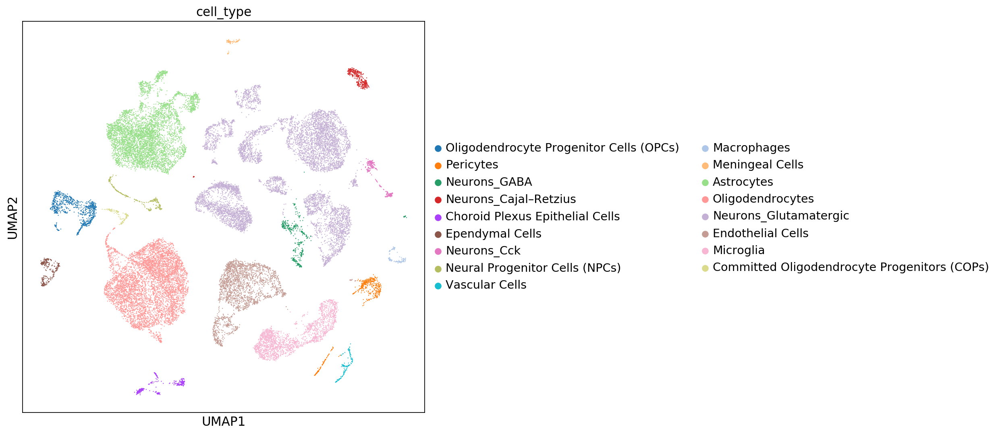

In [27]:
sc.pl.umap(adata, color='cell_type')

## Save to file 

Save the results for cellxgene browser display.  

In [28]:
sc.write(adata=adata, filename= './../data/cellxgene.h5ad')